In [131]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from tqdm import tqdm_notebook as tqdm
from numba import jit, njit, jitclass
import holoviews as hv
hv.extension('matplotlib')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

## One level L96

In [259]:
class L96OneLevel(object):
    def __init__(self, K=36, J=10, h=1, F=10, c=10, b=10, dt=0.001):
        self.K, self.J, self.h, self.F, self.c, self.b, self.dt = K, J, h, F, c, b, dt
        self.X = np.random.rand(self.K)
        self.Y = np.zeros((self.K, self.J))
        self._history_X = self.X[None, :]
        
    def _rhs(self, X):
        """Compute the right hand side of the ODE."""
        dXdt = (
            -np.roll(X, -1) * (np.roll(X, -2) - np.roll(X, 1)) - 
            X + self.F
        )       
        return dXdt
    
    def step(self):
        """Step forward one time step with RK4."""
        k1 = self.dt * self._rhs(self.X)
        k2 = self.dt * self._rhs(self.X + k1/2)
        k3 = self.dt * self._rhs(self.X + k2/2)
        k4 = self.dt * self._rhs(self.X + k3)
        self.X += 1/6 * (k1 + 2*k2 + 2*k3 + k4)
        self._history_X = np.concatenate([self._history_X, self.X[None, :]])
        
    def iterate(self, steps):
        for n in tqdm(range(steps)):
            self.step()
    
    @property
    def history(self):
        return xr.DataArray(self._history_X, dims=['time', 'x'], name='X')
    
    def animate(self, time_slice=slice(0, None, 1)):
        ds = hv.Dataset(self.history.isel(time=time_slice))
        return ds.to(hv.Curve, ['x'])
        

In [263]:
l96 = L96()

In [264]:
l96.iterate(100000)

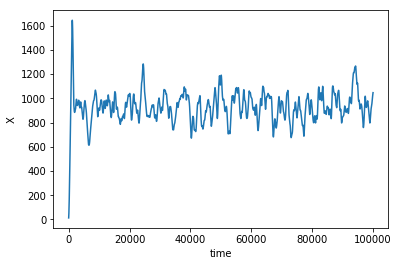

In [265]:
(l96.history**2).sum('x').plot()

In [92]:
%%output holomap='scrubber'
l96.animate(slice(-1000, None, 20))

:HoloMap   [time]
   :Curve   [x]   (X)

## Two level L96

In [279]:
class L96TwoLevelCoupled(object):
    def __init__(self, K=36, J=10, h=1, F=10, c=10, b=10, dt=0.001,
                 X_init=None):
        self.K, self.J, self.h, self.F, self.c, self.b, self.dt = K, J, h, F, c, b, dt
        self.X = np.random.rand(self.K) if X_init is None else X_init
        self.Y = np.zeros(self.K * self.J)
        self._history_X = self.X[None, :]
        self._history_Y = self.Y[None, :]
    
    def _rhs_X(self, X, Y):
        """Compute the right hand side of the X-ODE."""
        dXdt = (
            -np.roll(X, -1) * (np.roll(X, -2) - np.roll(X, 1)) - 
            X + self.F - self.h*self.c*Y.reshape(self.K, self.J).mean(1)
        )       
        return dXdt
    
    def _rhs_Y(self, X, Y):
        """Compute the right hand side of the Y-ODE."""
        dYdt = (
            -self.b * np.roll(Y, -1) * (np.roll(Y, -2) - np.roll(Y, 1)) -
            Y + self.h/self.J * np.repeat(X, self.J)
        ) / self.c
        return dYdt
    
    def _rhs_dt(self, X, Y):
        return self.dt * self._rhs_X(X, Y), self.dt * self._rhs_Y(X, Y)
    
    def step(self):
        k1_X, k1_Y = self._rhs_dt(self.X, self.Y)
        k2_X, k2_Y = self._rhs_dt(self.X + k1_X/2, self.Y + k1_Y/2)
        k3_X, k3_Y = self._rhs_dt(self.X + k2_X/2, self.Y + k2_Y/2)
        k4_X, k4_Y = self._rhs_dt(self.X + k3_X, self.Y + k3_Y)
        self.X += 1/6 * (k1_X + 2*k2_X + 2*k3_X + k4_X)
        self.Y += 1/6 * (k1_Y + 2*k2_Y + 2*k3_Y + k4_Y)
        self._history_X = np.concatenate([self._history_X, self.X[None, :]])
        self._history_Y = np.concatenate([self._history_Y, self.Y[None, :]])
        
    def iterate(self, steps):
        for n in tqdm(range(steps)):
            self.step()
    
    @property
    def history(self):
        da_X = xr.DataArray(self._history_X, dims=['time', 'x'], name='X')
        da_X_repeat = xr.DataArray(np.repeat(self._history_X, self.J, 1),
                                   dims=['time', 'y'], name='X_repeat')
        da_Y = xr.DataArray(self._history_Y, dims=['time', 'y'], name='Y')
        return xr.Dataset({'X': da_X, 'Y': da_Y, 'X_repeat': da_X_repeat})
    
    def animate(self, time_slice=slice(0, None, 1)):
        ds_X = hv.Dataset(self.history.X_repeat.isel(time=time_slice))
        ds_Y = hv.Dataset(self.history.Y.isel(time=time_slice) * 100)
        #return (ds_X.to(hv.Curve, ['y']) + ds_Y.to(hv.Curve, ['y'])).cols(1)
        return (ds_X.to(hv.Curve, ['y']) * ds_Y.to(hv.Curve, ['y']))

In [237]:
l96 = L96()

In [239]:
l96.iterate(10000)

In [240]:
%%output holomap='scrubber'
l96.animate(slice(-3000, None, 20))

:HoloMap   [time]
   :Overlay
      .Curve.I  :Curve   [y]   (X_repeat)
      .Curve.II :Curve   [y]   (Y)

## Check out some model statistics

In [241]:
l96.history

<xarray.Dataset>
Dimensions:   (time: 20001, x: 36, y: 360)
Dimensions without coordinates: time, x, y
Data variables:
    X         (time, x) float64 0.9469 0.5326 0.5591 ... 5.436 -1.119 -0.2724
    Y         (time, y) float64 9.423e-06 9.423e-06 9.423e-06 ... 0.1501 0.1328
    X_repeat  (time, y) float64 0.9469 0.9469 0.9469 ... -0.2724 -0.2724 -0.2724

In [254]:
h = l96.history

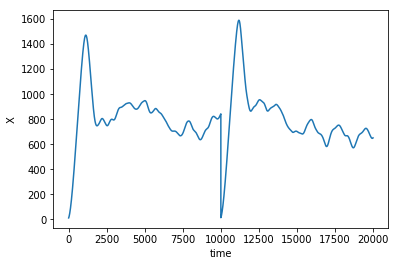

In [255]:
(h.X**2).sum(dim='x').plot()

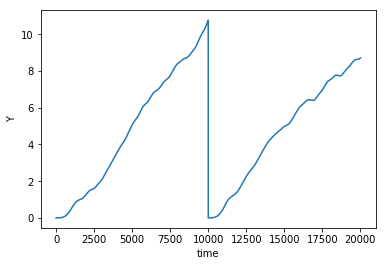

In [257]:
(h.Y**2).sum(dim='y').plot()

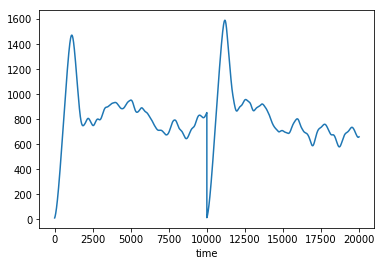

In [258]:
((h.X**2).sum(dim='x') + (h.Y**2).sum(dim='y')).plot()

## Uncoupled Two level model

In [313]:
class L96TwoLevelUncoupled(object):
    def __init__(self, K=36, J=10, h=1, F=10, c=10, b=10, dt=0.001, 
                 X_init=None):
        self.K, self.J, self.h, self.F, self.c, self.b, self.dt = K, J, h, F, c, b, dt
        self.X = np.random.rand(self.K) if X_init is None else X_init
        self.Y = np.zeros(self.K * self.J)
        self._history_X = self.X[None, :]
        self._history_Y = self.Y[None, :]
    
    def _rhs_X(self, X, Y_mean):
        """Compute the right hand side of the X-ODE."""
        dXdt = (
            -np.roll(X, -1) * (np.roll(X, -2) - np.roll(X, 1)) - 
            X + self.F - self.h*self.c*Y_mean
        )       
        return dXdt
    
    def _rhs_Y(self, X, Y):
        """Compute the right hand side of the Y-ODE."""
        dYdt = (
            -self.b * np.roll(Y, -1) * (np.roll(Y, -2) - np.roll(Y, 1)) -
            Y + self.h/self.J * np.repeat(X, self.J)
        ) / self.c
        return dYdt
    
    def _rhs_dt(self, X, Y):
        return self.dt * self._rhs_X(X, Y), self.dt * self._rhs_Y(X, Y)
    
    def step(self):
        # First get solution for X without updating Y
        Y_mean = self.Y.reshape(self.K, self.J).mean(1)
        k1_X = self.dt * self._rhs_X(self.X, Y_mean)
        k2_X = self.dt * self._rhs_X(self.X + k1_X/2, Y_mean)
        k3_X = self.dt * self._rhs_X(self.X + k2_X/2, Y_mean)
        k4_X = self.dt * self._rhs_X(self.X + k3_X, Y_mean)
        
        # Then update Y with unupdated X
        k1_Y = self.dt * self._rhs_Y(self.X, self.Y)
        k2_Y = self.dt * self._rhs_Y(self.X, self.Y + k1_Y/2)
        k3_Y = self.dt * self._rhs_Y(self.X, self.Y + k2_Y/2)
        k4_Y = self.dt * self._rhs_Y(self.X, self.Y + k3_Y)
        
        # Then update both
        self.X += 1/6 * (k1_X + 2*k2_X + 2*k3_X + k4_X)
        self.Y += 1/6 * (k1_Y + 2*k2_Y + 2*k3_Y + k4_Y)
        self._history_X = np.concatenate([self._history_X, self.X[None, :]])
        self._history_Y = np.concatenate([self._history_Y, self.Y[None, :]])
        
    def iterate(self, steps):
        for n in tqdm(range(steps)):
            self.step()
    
    @property
    def history(self):
        da_X = xr.DataArray(self._history_X, dims=['time', 'x'], name='X')
        da_X_repeat = xr.DataArray(np.repeat(self._history_X, self.J, 1),
                                   dims=['time', 'y'], name='X_repeat')
        da_Y = xr.DataArray(self._history_Y, dims=['time', 'y'], name='Y')
        return xr.Dataset({'X': da_X, 'Y': da_Y, 'X_repeat': da_X_repeat})
    
    def animate(self, time_slice=slice(0, None, 1)):
        ds_X = hv.Dataset(self.history.X_repeat.isel(time=time_slice))
        ds_Y = hv.Dataset(self.history.Y.isel(time=time_slice) * 100)
        #return (ds_X.to(hv.Curve, ['y']) + ds_Y.to(hv.Curve, ['y'])).cols(1)
        return (ds_X.to(hv.Curve, ['y']) * ds_Y.to(hv.Curve, ['y']))

In [314]:
X_init = np.random.rand(36)

In [315]:
l96_uncoupled = L96TwoLevelUncoupled(X_init=X_init.copy())

In [321]:
l96_uncoupled.iterate(10000)

In [317]:
l96_coupled = L96TwoLevelCoupled(X_init=X_init.copy())

In [318]:
l96_coupled.iterate(10000)

In [319]:
%%output holomap='scrubber'
l96_uncoupled.animate(slice(0, None, 50))

:HoloMap   [time]
   :Overlay
      .Curve.I  :Curve   [y]   (X_repeat)
      .Curve.II :Curve   [y]   (Y)

In [320]:
%%output holomap='scrubber'
l96_coupled.animate(slice(0, None, 50))

:HoloMap   [time]
   :Overlay
      .Curve.I  :Curve   [y]   (X_repeat)
      .Curve.II :Curve   [y]   (Y)